In [4]:
pip install overpy

     |████████████████████████████████| 51kB 13.0MB/s eta 0:00:01
  Stored in directory: /home/jupyterlab/.cache/pip/wheels/10/53/c2/e6b6f97e7bb419193bd3aafbe38628666f0f93a1cec9dc521d
Successfully built overpy
Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install lxml

     |████████████████████████████████| 5.8MB 3.3MB/s eta 0:00:01     |█████                           | 890kB 3.3MB/s eta 0:00:02�██████████▏                | 2.7MB 3.3MB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [6]:
pip install geopy

     |████████████████████████████████| 112kB 22.2MB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [7]:
import pandas as pd
import numpy as np
import scipy as sp
import json
import folium
from folium import plugins
import matplotlib
from matplotlib import cm
import overpy
import seaborn as sns
from geopy.geocoders import Nominatim
from sklearn.linear_model import LinearRegression
from sklearn.compose import TransformedTargetRegressor
from sklearn.metrics import median_absolute_error, r2_score

# Module 1: Scraping Reservoir Data from Reservoir Site

We will start by retrieving a dataset of live reserves of reservoirs in Spain. This information can be found in the site: Embalses.net .

In [ ]:
# First we will find all autonomous regions which appear in the site (not all regions have reservoirs):

url='https://www.embalses.net/comunidades.php'

#pd.read_html returns a list (of dataframes). There is only one and it can be accessed as the first element of the list.
df=pd.read_html(url)
df=df[0]

df.drop(columns=[1,2,4,5],inplace=True)
df.rename(columns={0:'Comunidad',3:'Embalsada'},inplace=True)
df.drop(index=0,inplace=True)


The data for each autonomous region is contained in a different url, so we will group them in a dictionary for ease of access.

In [ ]:
# We use an url dictionary to access the different autonomous' regions data

url_dict={
    'Andalucia':'https://www.embalses.net/comunidad-1-andalucia.html',
    'Aragon':'https://www.embalses.net/comunidad-2-aragon.html',
    'Asturias':'https://www.embalses.net/comunidad-3-asturias.html',
    'Cantabria':'https://www.embalses.net/comunidad-7-cantabria.html',
    'Castilla y Leon':'https://www.embalses.net/comunidad-9-castilla-y-leon.html',
    'Castilla-La Mancha':'https://www.embalses.net/comunidad-8-castilla-la-mancha.html',
    'Cataluña':'https://www.embalses.net/comunidad-10-cataluna.html',
    'Comunidad de Madrid':'https://www.embalses.net/comunidad-13-comunidad-de-madrid.html',
    'Comunidad Valenciana':'https://www.embalses.net/comunidad-17-comunidad-valenciana.html',
    'Extremadura':'https://www.embalses.net/comunidad-11-extremadura.html',
    'Galicia':'https://www.embalses.net/comunidad-12-galicia.html',
    'La Rioja':'https://www.embalses.net/comunidad-16-la-rioja.html',
    'Navarra':'https://www.embalses.net/comunidad-15-navarra.html',
    'Pais Vasco':'https://www.embalses.net/comunidad-5-pais-vasco.html',
    'Region de Murcia':'https://www.embalses.net/comunidad-14-region-de-murcia.html'
}

We will loop through all the names in the url dictionary to find all the reservoirs with weekly updates in each autonomous region.

In [ ]:
# Do in a for loop:
df_embalses=[]
for comunidad in df['Comunidad']:
    df_temp=[]
    url_temp=url_dict[comunidad]
    df_temp=pd.read_html(url_temp)
    df_temp=df_temp[1]
    df_temp.drop(index=0,inplace=True)
    df_temp.rename(columns={0:'Pantano',1:'Capacidad',2:'Embalsada',3:'Embalsada en Porcentaje'},inplace=True)
    df_temp['Embalsada en Porcentaje']=df_temp['Embalsada'].astype('int')/df_temp['Capacidad'].astype('int')*100
    df_temp.drop(columns=['Embalsada'],inplace=True)
    df_temp['Capacidad']=df_temp['Capacidad'].astype('float')
    if type(df_embalses)==type(df):
        df_embalses=df_embalses.append(df_temp)
    else:
        df_embalses=df_temp


In [ ]:
df_embalses.to_csv('Datos Embalses Basico')

## Module 1 Appendix A: Opening the csv file of the reservoir database (including shape)

When trying to complete the database with new data, we will open this file and then go through Module 3.

In [11]:
df_embalses=pd.read_csv('Datos Embalses')
df_embalses.drop('Unnamed: 0',axis=1,inplace=True)
# We reconstruct the node list from the csv file (now a string)
for i in range(len(df_embalses['Shape'])):
    if df_embalses['Shape'][i]!='NaN':  
        try:
            df_embalses['Shape'][i]=df_embalses['Shape'][i][2:-2].split('], [')
            for j in range(len(df_embalses['Shape'][i])):
                df_embalses['Shape'][i][j]=df_embalses['Shape'][i][j].split(',')
                df_embalses['Shape'][i][j][0]=float(df_embalses['Shape'][i][j][0])
                df_embalses['Shape'][i][j][1]=float(df_embalses['Shape'][i][j][1])
        except:
            pass

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


## Module 1 Appendix B: Opening the csv file of the basic reservoir database (not including shape)

We will open this file when trying to fill in the database from scratch (to be avoided at this stage, because it takes very long to fill it). After actioning this section, we would move to Module 3.

In [ ]:
df_embalses=pd.read_csv('Datos Embalses Basico')

# Module 2: Exploratory Data Analysis

In this section we will use perform an exploratory data analysis of the data source. We will look at the distribution of reservoirs by size using seaborn.kdeplot and we will look at some preliminary information of the level of reserves in each province (smaller than autonomous region).

## Dataset Size

In [15]:
df_embalses

,Pantano,Capacidad,Embalsada en Porcentaje,Categoria,Shape
0,AGUASCEBAS,6.0,100.000000,Pequeño,"[[38.0453061, -2.9518873], [38.0452156, -2.951..."
1,ALMODOVAR,6.0,33.333333,Pequeño,"[[36.1533646, -5.6495189], [36.1536862, -5.649..."
2,ANCHURICAS,6.0,50.000000,Pequeño,"[[38.185256, -2.5585025], [38.1862524, -2.5581..."
3,ANDEVALO,634.0,52.839117,Grande,"[[37.6161092, -7.4349656], [37.6158033, -7.435..."
4,ARACENA,129.0,51.937984,Mediano,"[[37.7880647, -6.6178243], [37.7887803, -6.616..."
...,...,...,...,...,...
351,ARGOS,10.0,70.000000,Pequeño,"[[38.1533277, -1.7440705], [38.1538193, -1.744..."
352,LA CIERVA,7.0,71.428571,Pequeño,"[[38.0597183, -1.489069], [38.059894, -1.48885..."
353,PUENTES,26.0,69.230769,Pequeño,"[[38.782339, -0.1050214], [38.7824159, -0.1050..."
354,SANTOMERA,26.0,23.076923,Pequeño,"[[38.0946303, -1.0886796], [38.0949395, -1.088..."


## Distribution in size of Reservoirs

Text(0, 0.5, 'Distribution Density')

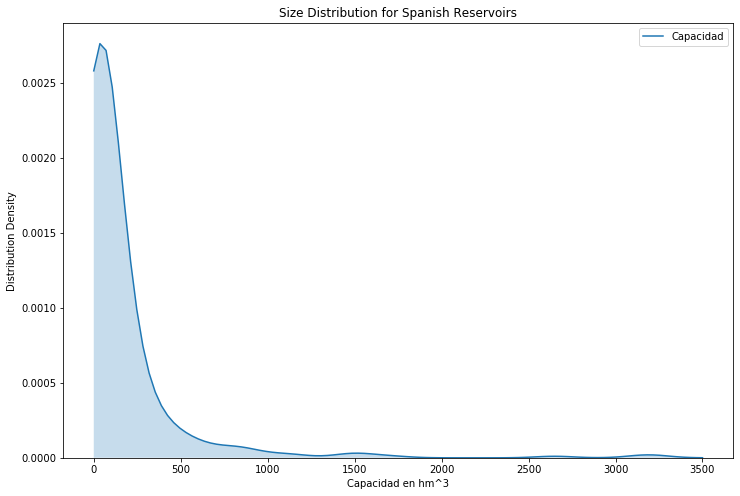

In [12]:
fig= matplotlib.pyplot.figure(figsize=[12,8])
ax=sns.kdeplot(df_embalses['Capacidad'], shade=True, clip=[0,3500])
ax.set_title('Size Distribution for Spanish Reservoirs')
ax.set_xlabel('Capacidad en hm^3')
ax.set_ylabel('Distribution Density')

We can see that most of the reservoirs are small, and that the number of reservoirs decreases exponentially with size.

## Geographical Distribution of Reserves

In a similar way to the data obtention section, we will retrieve further data from the website. In this case we will focus on retrieving reservoir capacity per province (a smaller administrative division than the autonomous region), in order to produce a choropleth map, with the level of reserves, relative to capacity in each province. The objective of this map is to show in broad strokes if there are any correlations between reservoir fill and geographical position.

In [87]:
url='https://www.embalses.net/provincias.php'

#pd.read_html returns a list (of dataframes). There is only one and it can be accessed as the first element of the list.
df=pd.read_html(url)
df=df[0]
df.drop(columns=[2,4,5],inplace=True)
df.rename(columns={0:'Provincia',1:'Capacidad',3:'Embalsada'},inplace=True)
df.drop(index=0,inplace=True)

# We convert the relative capacity from string to float
for i in range(1,len(df['Embalsada'])+1):
    df['Embalsada'][i]=df['Embalsada'][i].replace('(','').replace('%','').replace(')','')
    
df['Embalsada']=df['Embalsada'].astype('float')
df['Capacidad']=df['Capacidad'].astype('float')

In [90]:
world_geo = r'provincias-espanolas.geojson' # geojson file

# create a plain world map
m0 = folium.Map(location=[40.4166359, -3.7038101], zoom_start=6, tiles='Stamen Terrain')
m0.choropleth(
 geo_data=world_geo,
 name='choropleth',
 data=df,
 columns=['Provincia', 'Embalsada'],
 key_on='feature.properties.provincia',
 fill_color='RdYlGn',
 fill_opacity=0.7,
 line_opacity=0.2,
 legend_name='Capacidad Embalsada (%)'
)
folium.LayerControl().add_to(m0)
m0

By looking at the map we intuitively see that there might be some kind of geographical correlation with the relative reserves of the reservoirs: it seems that reservoirs that are further south tend to be emptier than those further north. We will consider this a working hypothesis which we will verify later in the project and we will give a level of certainty to our answer.

## Geographical Distribution of Capacity

In this section we will broadly explore if there could be  a geographical pattern in the distribution of reservoir capacity built.

In [89]:
world_geo = r'provincias-espanolas.geojson' # geojson file

# create a plain world map
m1 = folium.Map(location=[40.4166359, -3.7038101], zoom_start=6, tiles='Stamen Terrain')
m1.choropleth(
 geo_data=world_geo,
 name='choropleth',
 data=df,
 columns=['Provincia', 'Capacidad'],
 key_on='feature.properties.provincia',
 fill_color='Blues',
 fill_opacity=0.7,
 line_opacity=0.2,
 legend_name='Capacidad'
)
folium.LayerControl().add_to(m1)
m1

We can see that there are clearly two regions with more storage capacity built, but we are unable to find any specific patterns. We will further look into this hypothesis using more precise tools later in the project.

# Module 3: Finding Reservoirs in OpenStreetMap and retrieving their shapes

In this section, we will loop through the list of reservoirs and look for them in OpenStreetMaps, and we will retrieve their shapes for visualization. To do this we will perform calls to two different APIs: first, we will call the Nominatim API to retrieve the exact name of the reservoir in OSM (and the OSM object type), second, we will use this information to retrieve the reservoir's shape using the OverPass API. We will note that some of the larger reservoirs with more complex shapes are not retrievable using the OverPass API.

In [4]:
def name_processing (nombre):
    nombre_completo=nombre.split(',')
    nombre=nombre_completo[0].split()
    nombre_final=''
    # ,'la', 'los' , 'las'
    connectors=['de','del', 'do', 'da', 'dos', 'das', """d'""", """l'""", 'dels', 'les']
    if nombre_completo[-1]==' España':
        for palabra in nombre:
            if palabra.lower() in connectors:
                palabra=palabra.lower()
            nombre_final=nombre_final + palabra+' '
    else:
        nombre_final=None
        return nombre_final
    return nombre_final[:-1]

In [5]:
def get_shape (embalse, OSM_object_type):
    api = overpy.Overpass()
    if (OSM_object_type=='way')|(OSM_object_type=='relation'):
        query="""[out:json];%s["name"= "%s"];out;""" % ( OSM_object_type, embalse )
        print(query)
        result=api.query( query )
        if OSM_object_type=='way':
            return result.ways[0].get_nodes(resolve_missing=True)
        if OSM_object_type=='relation':
            nodes=[]
            for m in result.get_relations()[0].members:    
                nodes=nodes+(m.resolve(resolve_missing=True).get_nodes(resolve_missing=True))
            return nodes
    else:
        print('OSM_object_type not valid')

In [200]:
def get_location (embalse):
    nominatim=Nominatim(user_agent='Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/80.0.3987.163 Safari/537.36')
    #Belesar 
    search_query='Embalse de ' + embalse
    resultado=nominatim.geocode(search_query)
    if resultado != None:
        nombre=resultado.raw['display_name']
        osm_type=resultado.raw['osm_type']
    #bounding_box=tuple(list(map(float, resultado.raw['boundingbox'])))
    else:
        nombre=None
        osm_type=None
    return nombre, osm_type

In [201]:
j=0

In [ ]:
for i, embalse in zip(df_embalses.index[j:],df_embalses.Pantano[j:]):
    print(df_embalses.Pantano[i])
    try:
        if str(df_embalses['Shape'][i])=='nan':
            shape=[]
            embalse=embalse.title()
            nombre, osm_type = get_location(embalse)
            print(nombre)
            if nombre !=None:
                nombre=name_processing(nombre)
                nodes = get_shape(nombre, osm_type)
                for n in nodes:
                    shape.append([float(n.lat),float(n.lon)])
                df_embalses['Shape'][i]=shape
        j=i
    except:
        j=i

In [61]:
df_embalses.to_csv('Datos Embalses')

# Module 4: Showing the Reservoirs in the map

In [9]:
# We start by opening the reservoir database 

df_embalses=pd.read_csv('Datos Embalses')
df_embalses.drop('Unnamed: 0',axis=1,inplace=True)
# We reconstruct the node list from the csv file (now a string)
for i in range(len(df_embalses['Shape'])):
    if str(df_embalses['Shape'][i])!='nan':  
        try:
            df_embalses['Shape'][i]=df_embalses['Shape'][i][2:-2].split('], [')
            for j in range(len(df_embalses['Shape'][i])):
                df_embalses['Shape'][i][j]=df_embalses['Shape'][i][j].split(',')
                df_embalses['Shape'][i][j][0]=float(df_embalses['Shape'][i][j][0])
                df_embalses['Shape'][i][j][1]=float(df_embalses['Shape'][i][j][1])
        except:
            pass

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':


In [10]:
df_for_map=df_embalses.dropna()
m=folium.Map(location=[40.4166359, -3.7038101], zoom_start=6, tiles='Stamen Terrain')

formas = plugins.MarkerCluster().add_to(m)

cmap = matplotlib.cm.get_cmap('RdYlGn')
# loop through the dataframe and add each data point to the mark cluster
i=0
for embalse,  embalsada, capacidad, sh in zip(df_for_map.Pantano, df_for_map['Embalsada en Porcentaje'], df_for_map.Capacidad, df_for_map.Shape):
    i=i+1
    # for debbuging print(i)
    if sh!=None :
        folium.PolyLine(
            locations=sh,
            weight=5,
            color= 'rgb'+str(tuple(int((255*x)) for x in cmap(embalsada/100)[0:3])),
            popup='Embalse de '+ embalse +'\n'+'Capacidad en hm3: '+str(capacidad)+'\n'+'Agua embalsada en %: '+str(round(embalsada,2)),
        ).add_to(formas)        
# display map
m

# Module 5: Other results

In this section we will study if there is some geographical pattern to the relative level of reserves in reservoirs. We will use the df_for_map dataframe, as it will allow us to visually compare the results with the map.

R-squared= 0.14040099740295647


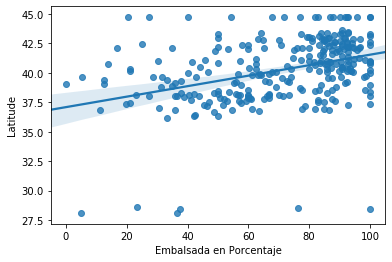

In [26]:
latitudes=[]
mask=np.array([],dtype=bool)
longitudes=[]
for sh, i in zip(df_for_map.Shape, range(len(df_for_map.Shape))):
    if sh[0][0]>30:    
        mask=np.append(mask,True)
    else:
        mask=np.append(mask,False)
    latitudes.append(sh[0][0])
    longitudes.append(sh[0][1])
axlat=sns.regplot(df_for_map['Embalsada en Porcentaje'],latitudes)
axlat.set_ylabel('Latitude')
print('R-squared= ' + str(np.corrcoef(df_for_map['Embalsada en Porcentaje'],latitudes)[0,1]**2))

R-squared= 0.13658572415560635


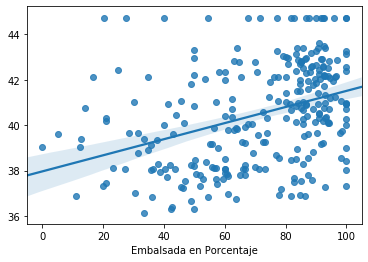

In [35]:
axlat=sns.regplot(df_for_map['Embalsada en Porcentaje'][mask],[item for keep, item in zip(mask,latitudes) if keep])
#axlat.set_ylabel('Latitude')
print('R-squared= ' + str(np.corrcoef(df_for_map['Embalsada en Porcentaje'][mask],[item for keep, item in zip(mask,latitudes) if keep])[0,1]**2))

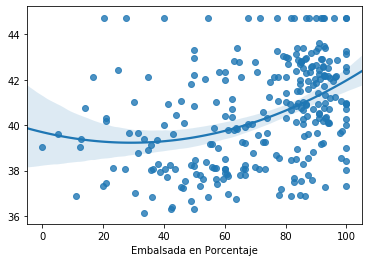

In [39]:
axlat=sns.regplot(df_for_map['Embalsada en Porcentaje'][mask],[item for keep, item in zip(mask,latitudes) if keep], order=2)

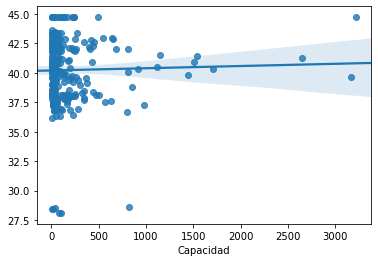

In [65]:
sns.regplot(df_for_map['Capacidad'],latitudes)

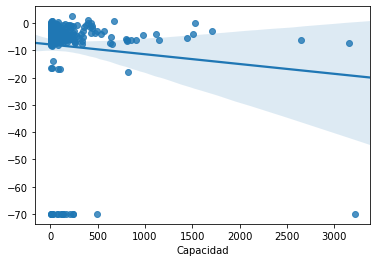

In [68]:
sns.regplot(df_for_map['Capacidad'],longitudes)